In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder

# For 3-class problem: hatespeech, normal, offensive
encoder = LabelEncoder()
encoder.classes_ = np.load('train.npy', allow_pickle=True)

print("Class labels:", encoder.classes_)

Class labels: ['hatespeech' 'normal' 'offensive']


In [ ]:
import json
import pandas as pd

# Load JSON file
with open('dataset.json', 'r') as f:  # replace with your JSON filename
    data = json.load(f)

# Convert to list of posts
posts = []
for post_id, info in data.items():
    # Take majority label of annotators
    labels = [ann['label'] for ann in info['annotators']]
    # Simple majority vote
    label = max(set(labels), key=labels.count)

    post_text = " ".join(info['post_tokens'])

    posts.append({
        'post_id': post_id,
        'text': post_text,
        'label': label
    })

# Convert to DataFrame
df = pd.DataFrame(posts)
df.head()

,post_id,text,label
0,1179055004553900032_twitter,i dont think im getting my baby them white 9 h...,normal
1,1179063826874032128_twitter,we cannot continue calling ourselves feminists...,normal
2,1178793830532956161_twitter,nawt yall niggers ignoring me,normal
3,1179088797964763136_twitter,<user> i am bit confused coz chinese ppl can n...,hatespeech
4,1179085312976445440_twitter,this bitch in whataburger eating a burger with...,hatespeech


In [ ]:
import re

def clean_text(text):
    text = text.lower()
    text = re.sub(r'http\S+', '', text)     # remove URLs
    text = re.sub(r'@\w+', '', text)        # remove mentions
    text = re.sub(r'#\w+', '', text)        # remove hashtags
    text = re.sub(r'[^a-zA-Z\s]', '', text) # remove punctuation & numbers
    text = text.strip()
    return text

df['cleaned_text'] = df['text'].apply(clean_text)
df.head()

,post_id,text,label,cleaned_text
0,1179055004553900032_twitter,i dont think im getting my baby them white 9 h...,normal,i dont think im getting my baby them white he...
1,1179063826874032128_twitter,we cannot continue calling ourselves feminists...,normal,we cannot continue calling ourselves feminists...
2,1178793830532956161_twitter,nawt yall niggers ignoring me,normal,nawt yall niggers ignoring me
3,1179088797964763136_twitter,<user> i am bit confused coz chinese ppl can n...,hatespeech,user i am bit confused coz chinese ppl can not...
4,1179085312976445440_twitter,this bitch in whataburger eating a burger with...,hatespeech,this bitch in whataburger eating a burger with...


/tmp/ipython-input-247706047.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')


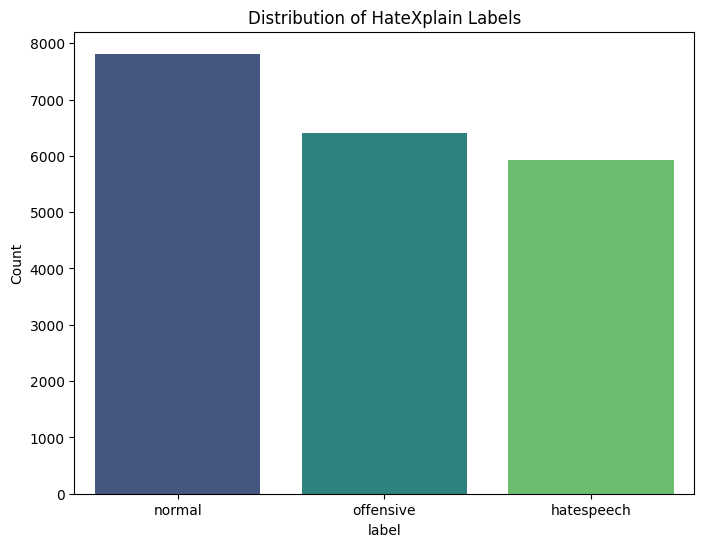

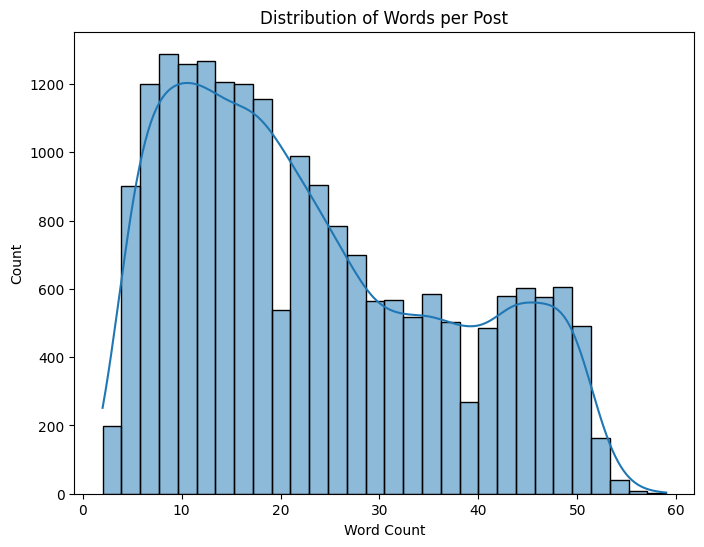

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Label distribution
label_counts = df['label'].value_counts()
plt.figure(figsize=(8,6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
plt.title("Distribution of HateXplain Labels")
plt.ylabel("Count")
plt.show()

# Number of words per post
df['word_count'] = df['cleaned_text'].apply(lambda x: len(x.split()))
plt.figure(figsize=(8,6))
sns.histplot(df['word_count'], bins=30, kde=True)
plt.title("Distribution of Words per Post")
plt.xlabel("Word Count")
plt.show()

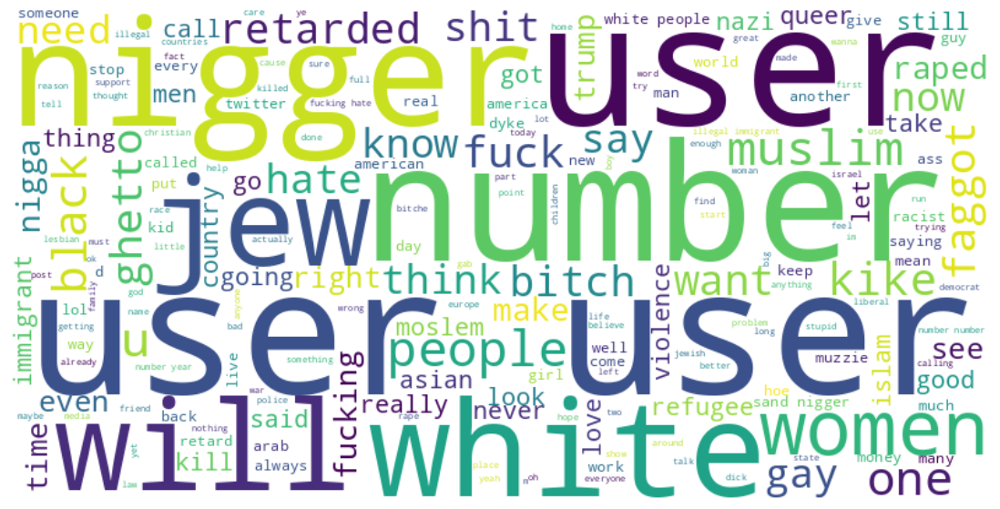

Top 20 Words: [('the', 16029), ('a', 10967), ('to', 10332), ('and', 9504), ('i', 7658), ('user', 7471), ('you', 7101), ('of', 6965), ('is', 6533), ('not', 5703), ('in', 5579), ('are', 5526), ('that', 5293), ('it', 4632), ('white', 3868), ('for', 3700), ('they', 3699), ('number', 3143), ('be', 2838), ('have', 2698)]


/tmp/ipython-input-624228125.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[w[1] for w in common_words], y=[w[0] for w in common_words], palette='magma')


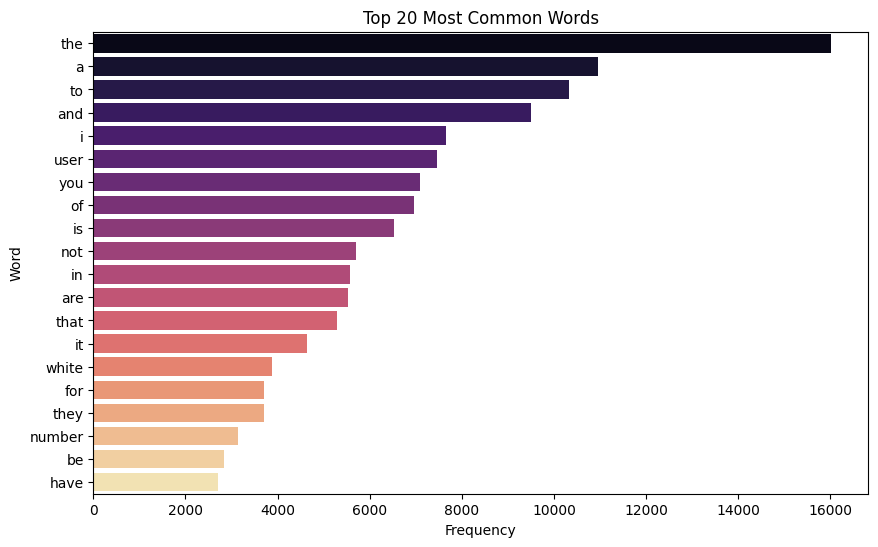

In [ ]:
# Install required libraries
!pip install wordcloud

import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

# Combine all text
all_text = " ".join(df['cleaned_text'])

# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Top 20 most common words
words = all_text.split()
word_freq = Counter(words)
common_words = word_freq.most_common(20)
print("Top 20 Words:", common_words)

# Bar plot of top words
plt.figure(figsize=(10,6))
sns.barplot(x=[w[1] for w in common_words], y=[w[0] for w in common_words], palette='magma')
plt.xlabel("Frequency")
plt.ylabel("Word")
plt.title("Top 20 Most Common Words")
plt.show()

In [ ]:
!pip install transformers datasets

import torch
from torch.utils.data import DataLoader
from transformers import BertTokenizer, BertForSequenceClassification,get_scheduler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
from torch.optim import AdamW
# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Encode labels
encoder = LabelEncoder()
df['label_encoded'] = encoder.fit_transform(df['label'])

# Split dataset
train_texts, test_texts, train_labels, test_labels = train_test_split(df['cleaned_text'], df['label_encoded'], test_size=0.1, random_state=42)

# Tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize
train_encodings = tokenizer(list(train_texts), truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(list(test_texts), truncation=True, padding=True, max_length=128)

# Create Dataset
class HateDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __len__(self):
        return len(self.labels)
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

train_dataset = HateDataset(train_encodings, list(train_labels))
test_dataset = HateDataset(test_encodings, list(test_labels))

# DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16)

# Model
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=len(encoder.classes_))
model.to(device)

# Optimizer and Scheduler
optimizer = AdamW(model.parameters(), lr=2e-5)
num_training_steps = len(train_loader) * 11  # 3 epochs
scheduler = get_scheduler("linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)

# Loss
from torch.nn import CrossEntropyLoss
loss_fn = CrossEntropyLoss()

# Training Loop
from tqdm.auto import tqdm

epochs = 11
for epoch in range(epochs):
    model.train()
    loop = tqdm(train_loader, leave=True)
    for batch in loop:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()
        loop.set_description(f'Epoch {epoch}')
        loop.set_postfix(loss=loss.item())

# Save Model
model.save_pretrained("bert_hatexplain")
tokenizer.save_pretrained("bert_hatexplain")

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

  0%|          | 0/1134 [00:00<?, ?it/s]

('bert_hatexplain/tokenizer_config.json',
 'bert_hatexplain/special_tokens_map.json',
 'bert_hatexplain/vocab.txt',
 'bert_hatexplain/added_tokens.json')

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for batch in test_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask)
        preds = torch.argmax(outputs.logits, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Metrics
print(classification_report(all_labels, all_preds, target_names=encoder.classes_))

              precision    recall  f1-score   support

  hatespeech       0.74      0.73      0.74       600
      normal       0.72      0.67      0.69       777
   offensive       0.54      0.58      0.56       638

    accuracy                           0.66      2015
   macro avg       0.66      0.66      0.66      2015
weighted avg       0.67      0.66      0.66      2015



In [ ]:
!pip install lime

from lime.lime_text import LimeTextExplainer
import numpy as np

# Define class names
class_names = list(encoder.classes_)

# LIME explainer
explainer = LimeTextExplainer(class_names=class_names)

# Function for prediction
def predict_proba(texts):
    encodings = tokenizer(texts, truncation=True, padding=True, max_length=128, return_tensors="pt")
    input_ids = encodings['input_ids'].to(device)
    attention_mask = encodings['attention_mask'].to(device)
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
        probs = torch.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

# Example
i = 10  # example index
exp = explainer.explain_instance(df['cleaned_text'].iloc[i], predict_proba, num_features=10)
exp.show_in_notebook(text=True)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8f3ea89cc07a56c511cd3f5ef35a6967493d0552e0b4f4573d010edd47636292
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Encode labels
le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['label'])

print("Label classes mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# Split dataset
train_df, test_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df['label_encoded'],
    random_state=42
)

print("Train size:", len(train_df), "Test size:", len(test_df))

Label classes mapping: {'hatespeech': np.int64(0), 'normal': np.int64(1), 'offensive': np.int64(2)}
Train size: 16118 Test size: 4030


In [ ]:
import torch
from torch.utils.data import Dataset
from transformers import AutoTokenizer

model_name = "GroNLP/hateBERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)

class TextDataset(Dataset):
    def __init__(self, df, tokenizer, max_len=128):
        self.texts = df['cleaned_text'].tolist()
        self.labels = df['label_encoded'].tolist()
        self.encodings = tokenizer(
            self.texts,
            padding='max_length',
            truncation=True,
            max_length=max_len
        )

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

train_dataset = TextDataset(train_df, tokenizer)
test_dataset = TextDataset(test_df, tokenizer)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/151 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer
import torch.nn as nn
import numpy as np

# Compute class weights
label_counts = train_df['label_encoded'].value_counts().sort_index().values
class_weights = 1.0 / label_counts
class_weights = class_weights / class_weights.sum() * len(label_counts)
print("Class Weights:", class_weights)

# Load HateBERT model
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=len(le.classes_)
)

# Custom Trainer for weighted loss
class WeightedTrainer(Trainer):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = torch.tensor(class_weights, dtype=torch.float)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        labels = inputs.get("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        if logits.device != self.class_weights.device:
            self.class_weights = self.class_weights.to(logits.device)

        loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        loss = loss_fct(logits, labels)
        return (loss, outputs) if return_outputs else loss

# Training args
training_args = TrainingArguments(
    output_dir="./hatebert_results",
    num_train_epochs=17,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    logging_dir="./logs",
    eval_strategy="epoch",
    save_strategy="epoch",
    report_to="none"  # disable wandb
)

trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer,
    class_weights=class_weights
)

Class Weights: [1.08590437 0.73802948 1.17606614]


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at GroNLP/hateBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2673829707.py:20: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `WeightedTrainer.__init__`. Use `processing_class` instead.
  super().__init__(*args, **kwargs)


In [ ]:
from transformers import TrainingArguments
import transformers
print("Active Transformers version:", transformers.__version__)

Active Transformers version: 4.57.0


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss
1,0.792900,0.757879
2,0.648800,0.806420
3,0.461400,1.155927
4,0.372000,1.572040
5,0.321900,2.030087
6,0.213200,2.346055
7,0.160500,2.641192
8,0.119800,2.822923
9,0.106500,3.040176
10,0.078400,3.190637


TrainOutput(global_step=34255, training_loss=0.19578641748240422, metrics={'train_runtime': 7712.6378, 'train_samples_per_second': 35.527, 'train_steps_per_second': 4.441, 'total_flos': 1.802366378449459e+16, 'train_loss': 0.19578641748240422, 'epoch': 17.0})

In [ ]:
from sklearn.metrics import classification_report

predictions = trainer.predict(test_dataset)
y_pred = np.argmax(predictions.predictions, axis=1)
y_true = predictions.label_ids

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=le.classes_))


Classification Report:
              precision    recall  f1-score   support

  hatespeech       0.71      0.76      0.74      1187
      normal       0.74      0.66      0.70      1747
   offensive       0.47      0.52      0.49      1096

    accuracy                           0.65      4030
   macro avg       0.64      0.65      0.64      4030
weighted avg       0.66      0.65      0.65      4030



In [ ]:
model_save_path = "./hatebert_trained"

# Save model
trainer.model.save_pretrained(model_save_path)

# Save tokenizer
tokenizer.save_pretrained(model_save_path)

('./hatebert_trained/tokenizer_config.json',
 './hatebert_trained/special_tokens_map.json',
 './hatebert_trained/vocab.txt',
 './hatebert_trained/added_tokens.json',
 './hatebert_trained/tokenizer.json')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import torch
from torch.utils.data import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    EarlyStoppingCallback
)
import torch.nn as nn
import numpy as np
from sklearn.metrics import classification_report

# -----------------------------
# 1️⃣ Data Preparation
# -----------------------------
# df = pd.read_csv("your_dataset.csv")
# df should have 'cleaned_text' and 'label' columns

le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['label'])
print("Label mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

train_df, test_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df['label_encoded'],
    random_state=42
)
print("Train size:", len(train_df), "| Test size:", len(test_df))

# -----------------------------
# 2️⃣ Tokenizer & Dataset
# -----------------------------
model_name = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name)

class TextDataset(Dataset):
    def __init__(self, df, tokenizer, max_len=128):
        self.texts = df['cleaned_text'].tolist()
        self.labels = df['label_encoded'].tolist()
        self.encodings = tokenizer(
            self.texts,
            padding='max_length',
            truncation=True,
            max_length=max_len
        )

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

train_dataset = TextDataset(train_df, tokenizer)
test_dataset = TextDataset(test_df, tokenizer)

# -----------------------------
# 3️⃣ Class Weights
# -----------------------------
label_counts = train_df['label_encoded'].value_counts().sort_index().values
class_weights = 1.0 / label_counts
class_weights = class_weights / class_weights.sum() * len(label_counts)
print("Class Weights:", class_weights)

# -----------------------------
# 4️⃣ Model Initialization
# -----------------------------
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=len(le.classes_)
)

# -----------------------------
# 5️⃣ Custom Weighted Trainer
# -----------------------------
class WeightedTrainer(Trainer):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = torch.tensor(class_weights, dtype=torch.float)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        """
        Updated to include num_items_in_batch for HF>=4.46 compatibility.
        """
        labels = inputs.get("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        if logits.device != self.class_weights.device:
            self.class_weights = self.class_weights.to(logits.device)

        loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        loss = loss_fct(logits, labels)
        return (loss, outputs) if return_outputs else loss

# -----------------------------
# 6️⃣ Training Args with Early Stopping
# -----------------------------
training_args = TrainingArguments(
    output_dir="./roberta_results",
    num_train_epochs=17,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False,
    logging_dir="./logs_roberta",
    logging_steps=50,
    report_to="none"
)

# -----------------------------
# 7️⃣ Trainer + Early Stopping
# -----------------------------
trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer,
    class_weights=class_weights,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

# -----------------------------
# 8️⃣ Train
# -----------------------------
trainer.train()

# -----------------------------
# 9️⃣ Evaluate
# -----------------------------
predictions = trainer.predict(test_dataset)
y_pred = np.argmax(predictions.predictions, axis=1)
y_true = predictions.label_ids

print("\n📊 Classification Report (RoBERTa):")
print(classification_report(y_true, y_pred, target_names=le.classes_))

Label mapping: {'hatespeech': np.int64(0), 'normal': np.int64(1), 'offensive': np.int64(2)}
Train size: 16118 | Test size: 4030
Class Weights: [0.95913326 0.84129382 1.19957292]


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-3650323809.py:84: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `WeightedTrainer.__init__`. Use `processing_class` instead.
  super().__init__(*args, **kwargs)


Epoch,Training Loss,Validation Loss
1,0.965400,0.906723
2,0.968800,0.956928
3,0.944600,0.955348
4,1.053900,1.039703



📊 Classification Report (RoBERTa):
              precision    recall  f1-score   support

  hatespeech       0.67      0.75      0.71      1371
      normal       0.65      0.67      0.66      1563
   offensive       0.39      0.32      0.35      1096

    accuracy                           0.60      4030
   macro avg       0.57      0.58      0.57      4030
weighted avg       0.59      0.60      0.59      4030



In [ ]:
!pip install lime -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import torch
import numpy as np
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from lime.lime_text import LimeTextExplainer

# Load your trained HateBERT
model_path = "./hatebert_trained"
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
model.eval()

# Mapping label ids to names
label_map = {0: "hatespeech", 1: "normal", 2: "offensive"}


In [ ]:
def predict_proba(texts):
    inputs = tokenizer(
        texts,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    ).to(device)

    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

In [ ]:
explainer = LimeTextExplainer(class_names=list(label_map.values()))


In [ ]:
sample_text = "I hate this behavior, it is unacceptable."

exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=10,   # number of words to highlight
    top_labels=1
)

# Show explanation for the top predicted label
top_label = exp.top_labels[0]
print("Predicted label:", label_map[top_label])

# Show the word contributions
print(exp.as_list(label=top_label))

# Optional: visualize as HTML
exp.show_in_notebook(text=True)


Predicted label: hatespeech
[(np.str_('unacceptable'), 0.6746670965674865), (np.str_('behavior'), 0.4761752573289838), (np.str_('is'), -0.1443106785680488), (np.str_('hate'), 0.11259099224332486), (np.str_('this'), -0.05369014930227587), (np.str_('it'), -0.03673282439784879), (np.str_('I'), 0.011392279167294787)]


In [ ]:
!pip install pandas emoji regex -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 14.5 MB/s eta 0:00:00


In [ ]:
import pandas as pd

train_df = pd.read_excel("hate_train.xlsx")
val_df   = pd.read_excel("hate_valid.xlsx")
test_df  = pd.read_excel("hate_test.xlsx")

print(train_df.head())

                                                text label
0  @lokmat बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख ब...  HATE
1  @BalaNandgaonkar स्वतःचे खिसे भरत आहेत, यांना ...  HATE
2  या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...  HATE
3  एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...  HATE
4  @KiritSomaiya @BJP4India @BJP4Maharashtra जंगी...  HATE


In [ ]:
import re
import emoji

def clean_text(text):
    if pd.isna(text):
        return ""

    # Convert to string (in case of numbers)
    text = str(text)

    # Remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)

    # Remove mentions (@username)
    text = re.sub(r'@\w+', '', text)

    # Remove hashtags (keep text after # if needed)
    text = re.sub(r'#\w+', '', text)

    # Remove emojis
    text = emoji.replace_emoji(text, replace='')

    # Remove special characters, punctuation, English digits
    text = re.sub(r'[^ऀ-ॿa-zA-Z\s]', '', text)

    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()

    return text

In [ ]:
for df in [train_df, val_df, test_df]:
    df['cleaned_text'] = df['text'].apply(clean_text)

print(train_df[['text', 'cleaned_text']].head(10))

                                                text  \
0  @lokmat बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख ब...   
1  @BalaNandgaonkar स्वतःचे खिसे भरत आहेत, यांना ...   
2  या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...   
3  एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...   
4  @KiritSomaiya @BJP4India @BJP4Maharashtra जंगी...   
5  @BhatkhalkarA पवारजी लवकर बरे वहा. अजून चिवसेन...   
6  देशद्रोही ,हिंदू द्वेष्टे भ्रषाटाचारी .यांच्या...   
7  @Prakashgadepat1 नीच विचारसरणी असलेले लोक आहे ...   
8  ट्विटरवरील ताईंचे दादा ही सर्वात हरामी जमात आह...   
9  सत्तेविना तडफडणारी काँग्रेस पंतप्रधान मोदींच्य...   

                                        cleaned_text  
0  बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख बनवणं बंद...  
1  स्वतःचे खिसे भरत आहेत यांना सामान्य जनता मेली ...  
2  या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...  
3  एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...  
4  जंगी स्वागत तर होणारच अन्यायाच्या विरोधात भारत...  
5  पवारजी लवकर बरे वहा अजून चिवसेना थोडी बाकी आहे... 

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Example: Load your train Excel file
train_df = pd.read_excel("hate_train.xlsx")

# Apply the cleaning function
train_df['cleaned_text'] = train_df['text'].apply(clean_text)

# Check first few rows
print(train_df.head())

# Suppose your columns are 'text' and 'label'
# Label examples: HATE, OFFN, PRFN, NOT
label_encoder = LabelEncoder()
train_df['label_encoded'] = label_encoder.fit_transform(train_df['label'])

print("Label classes:", label_encoder.classes_)
print(train_df[['label', 'label_encoded']].head())

                                                text label  \
0  @lokmat बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख ब...  HATE   
1  @BalaNandgaonkar स्वतःचे खिसे भरत आहेत, यांना ...  HATE   
2  या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...  HATE   
3  एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...  HATE   
4  @KiritSomaiya @BJP4India @BJP4Maharashtra जंगी...  HATE   

                                        cleaned_text  
0  बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख बनवणं बंद...  
1  स्वतःचे खिसे भरत आहेत यांना सामान्य जनता मेली ...  
2  या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...  
3  एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...  
4  जंगी स्वागत तर होणारच अन्यायाच्या विरोधात भारत...  
Label classes: ['HATE' 'NOT' 'OFFN' 'PRFN']
  label  label_encoded
0  HATE              0
1  HATE              0
2  HATE              0
3  HATE              0
4  HATE              0


In [ ]:
train_df.head(10)

,text,label,cleaned_text,label_encoded
0,@lokmat बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख ब...,HATE,बहुसंख्यांक हिंदूंना घाबरट आणि मुर्ख बनवणं बंद...,0
1,"@BalaNandgaonkar स्वतःचे खिसे भरत आहेत, यांना ...",HATE,स्वतःचे खिसे भरत आहेत यांना सामान्य जनता मेली ...,0
2,या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...,HATE,या पुचाट UNO पेक्षा आमच्याकडचं ENO जास्त प्रभा...,0
3,एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...,HATE,एक हिजाब परिधान केलेली मुलगी काल परवापासून व्ह...,0
4,@KiritSomaiya @BJP4India @BJP4Maharashtra जंगी...,HATE,जंगी स्वागत तर होणारच अन्यायाच्या विरोधात भारत...,0
5,@BhatkhalkarA पवारजी लवकर बरे वहा. अजून चिवसेन...,HATE,पवारजी लवकर बरे वहा अजून चिवसेना थोडी बाकी आहे...,0
6,"देशद्रोही ,हिंदू द्वेष्टे भ्रषाटाचारी .यांच्या...",HATE,देशद्रोही हिंदू द्वेष्टे भ्रषाटाचारी यांच्या ढ...,0
7,@Prakashgadepat1 नीच विचारसरणी असलेले लोक आहे ...,HATE,नीच विचारसरणी असलेले लोक आहे जे विद्यार्थ्यांच...,0
8,ट्विटरवरील ताईंचे दादा ही सर्वात हरामी जमात आह...,HATE,ट्विटरवरील ताईंचे दादा ही सर्वात हरामी जमात आह...,0
9,सत्तेविना तडफडणारी काँग्रेस पंतप्रधान मोदींच्य...,HATE,सत्तेविना तडफडणारी काँग्रेस पंतप्रधान मोदींच्य...,0


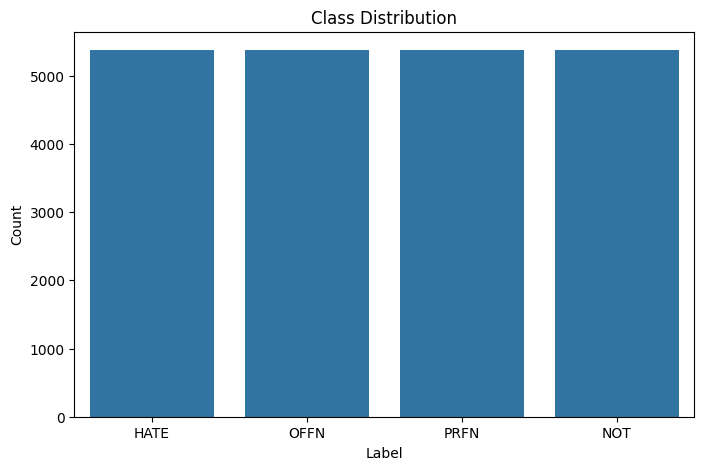

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

label_counts = train_df['label'].value_counts()

plt.figure(figsize=(8,5))
sns.barplot(x=label_counts.index, y=label_counts.values)
plt.title("Class Distribution")
plt.ylabel("Count")
plt.xlabel("Label")
plt.show()

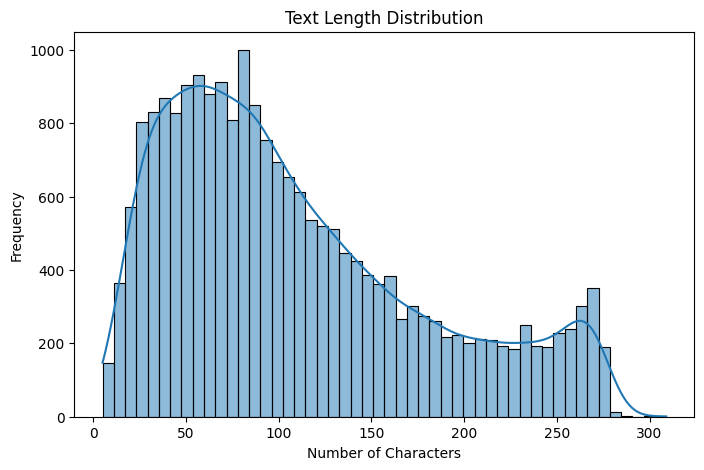

In [ ]:
train_df['text_length'] = train_df['cleaned_text'].apply(len)

plt.figure(figsize=(8,5))
sns.histplot(train_df['text_length'], bins=50, kde=True)
plt.title("Text Length Distribution")
plt.xlabel("Number of Characters")
plt.ylabel("Frequency")
plt.show()

In [ ]:
!wget -O /usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf https://github.com/googlefonts/noto-fonts/raw/main/hinted/ttf/NotoSansDevanagari/NotoSansDevanagari-Regular.ttf
!fc-cache -f -v

/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf: No such file or directory
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 2 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent cache directory
/root/.fontconfig: not cleaning non-existent cache directory
fc-cache: succeeded


In [ ]:
import os
import requests

# Create a temporary directory if it doesn't exist
temp_dir = "/tmp/fonts"
os.makedirs(temp_dir, exist_ok=True)

# Download the font file
font_url = "https://github.com/googlefonts/noto-fonts/raw/main/hinted/ttf/NotoSansDevanagari/NotoSansDevanagari-Regular.ttf"
font_path = os.path.join(temp_dir, "NotoSansDevanagari-Regular.ttf")

# Check if the file already exists to avoid re-downloading
if not os.path.exists(font_path):
    print(f"Downloading font from {font_url} to {font_path}")
    response = requests.get(font_url, allow_redirects=True)
    with open(font_path, 'wb') as f:
        f.write(response.content)
    print("Download complete.")
else:
    print(f"Font already exists at {font_path}")

# Verify the file exists
if os.path.exists(font_path):
    print(f"Font file verified at {font_path}")
else:
    print(f"Error: Font file not found at {font_path}")

Download complete.
Font file verified at /tmp/fonts/NotoSansDevanagari-Regular.ttf


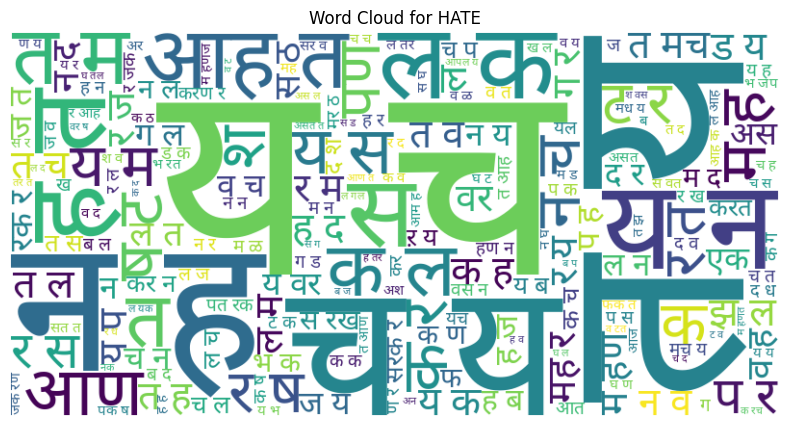

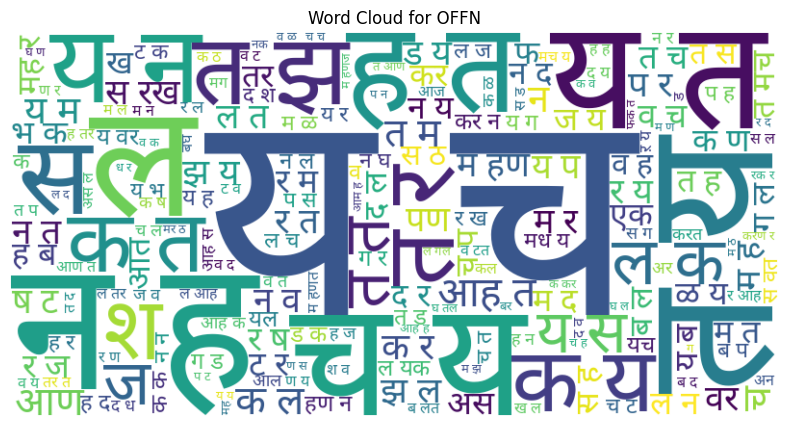

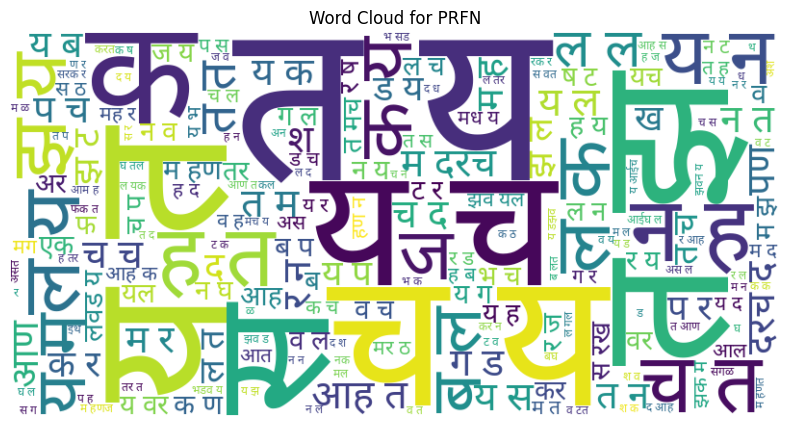

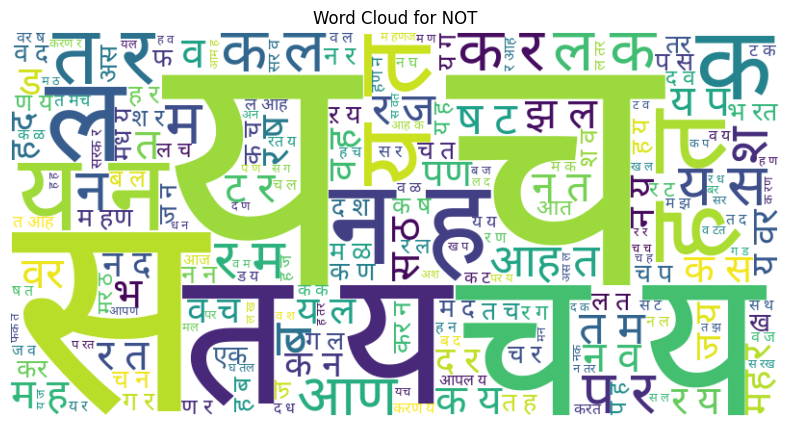

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Use the downloaded font path
font_path = "/tmp/fonts/NotoSansDevanagari-Regular.ttf"


for label in train_df['label'].unique():
    text_data = " ".join(train_df[train_df['label'] == label]['cleaned_text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white',
                          font_path=font_path).generate(text_data)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {label}")
    plt.show()

In [ ]:
from collections import Counter
import re

def get_top_n_words(texts, n=20):
    words = []
    for txt in texts:
        words.extend(re.findall(r'\w+', txt))
    return Counter(words).most_common(n)

for label in train_df['label'].unique():
    top_words = get_top_n_words(train_df[train_df['label']==label]['cleaned_text'])
    print(f"Top words for {label}:\n", top_words[:15], "\n")

Top words for HATE:
 [('य', 17060), ('त', 17057), ('न', 13992), ('र', 12970), ('क', 11783), ('ल', 11685), ('च', 10600), ('ह', 10297), ('म', 7949), ('स', 7263), ('व', 6568), ('द', 6355), ('प', 5062), ('ज', 4063), ('ब', 3954)] 

Top words for OFFN:
 [('य', 15565), ('त', 15349), ('न', 10662), ('ल', 10519), ('क', 10323), ('र', 10078), ('च', 8354), ('ह', 8210), ('म', 6805), ('स', 6385), ('व', 5467), ('द', 4791), ('प', 4645), ('ब', 3968), ('ट', 3368)] 

Top words for PRFN:
 [('य', 15347), ('त', 13701), ('ल', 9718), ('च', 8809), ('न', 8703), ('क', 8110), ('र', 7426), ('ह', 6229), ('म', 6183), ('द', 4833), ('स', 4765), ('व', 3944), ('प', 3802), ('ब', 3459), ('ट', 2929)] 

Top words for NOT:
 [('य', 16605), ('त', 15866), ('र', 13289), ('न', 12975), ('क', 11439), ('ल', 10760), ('च', 9543), ('ह', 8902), ('स', 8296), ('म', 8247), ('व', 8019), ('द', 6081), ('प', 6042), ('ज', 4340), ('ट', 3786)] 



In [ ]:
!pip install transformers datasets scikit-learn matplotlib seaborn -q

In [ ]:
import pandas as pd
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

In [ ]:
label_encoder = LabelEncoder()
val_df['label_encoded']=label_encoder.fit_transform(val_df['label'])
test_df['label_encoded']=label_encoder.fit_transform(test_df['label'])

In [ ]:
model_name = "google/muril-base-cased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

MAX_LEN = 128  # can increase to 256 if texts are long

def tokenize(batch):
    return tokenizer(batch["cleaned_text"], truncation=True, padding="max_length", max_length=MAX_LEN)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/206 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/411 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/113 [00:00<?, ?B/s]

In [ ]:
from datasets import Dataset, DatasetDict

train_ds = Dataset.from_pandas(train_df[['cleaned_text', 'label_encoded']])
valid_ds = Dataset.from_pandas(val_df[['cleaned_text', 'label_encoded']])
test_ds  = Dataset.from_pandas(test_df[['cleaned_text', 'label_encoded']])

dataset = DatasetDict({
    "train": train_ds,
    "validation": valid_ds,
    "test": test_ds
}).map(tokenize, batched=True)

dataset = dataset.rename_column("label_encoded", "labels")
dataset.set_format("torch", columns=["input_ids", "attention_mask", "labels"])

Map:   0%|          | 0/21500 [00:00<?, ? examples/s]

Map:   0%|          | 0/1500 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=len(label_encoder.classes_)
)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at google/muril-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc, "precision": precision, "recall": recall, "f1": f1}

In [ ]:
training_args = TrainingArguments(
    output_dir="./muril_results",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=9,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=50,
    report_to="none"  # disables wandb
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=dataset["train"],
    eval_dataset=dataset["validation"],
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

trainer.train()

/tmp/ipython-input-442231917.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.612800,0.561912,0.796000,0.808862,0.796000,0.796853
2,0.446200,0.552346,0.818667,0.820322,0.818667,0.818023
3,0.422700,0.753474,0.808000,0.820299,0.808000,0.806598
4,0.301000,0.793270,0.822000,0.822524,0.822000,0.822027
5,0.326200,0.987288,0.791333,0.795734,0.791333,0.789303
6,0.092000,1.076115,0.799333,0.802872,0.799333,0.800305
7,0.148600,1.081000,0.812667,0.813607,0.812667,0.812557
8,0.050700,1.159357,0.804667,0.805082,0.804667,0.804707
9,0.112200,1.192074,0.808000,0.807767,0.808000,0.807720


TrainOutput(global_step=24192, training_loss=0.3253397435176546, metrics={'train_runtime': 6310.364, 'train_samples_per_second': 30.664, 'train_steps_per_second': 3.834, 'total_flos': 1.2728225862144e+16, 'train_loss': 0.3253397435176546, 'epoch': 9.0})

In [ ]:
test_results = trainer.evaluate(dataset["test"])
print("📊 Test Results:", test_results)

📊 Test Results: {'eval_loss': 1.1704058647155762, 'eval_accuracy': 0.81, 'eval_precision': 0.809566529248976, 'eval_recall': 0.81, 'eval_f1': 0.8097533210888314, 'eval_runtime': 13.914, 'eval_samples_per_second': 143.74, 'eval_steps_per_second': 17.968, 'epoch': 9.0}


In [ ]:
from sklearn.metrics import classification_report

predictions = trainer.predict(dataset["test"])
y_pred = np.argmax(predictions.predictions, axis=1)
y_true = predictions.label_ids

print(classification_report(y_true, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

        HATE       0.74      0.76      0.75       500
         NOT       0.82      0.80      0.81       500
        OFFN       0.79      0.79      0.79       500
        PRFN       0.94      0.95      0.95       500

    accuracy                           0.82      2000
   macro avg       0.82      0.82      0.82      2000
weighted avg       0.82      0.82      0.82      2000



In [ ]:
trainer.save_model("./muril_marathi_hatespeech")
tokenizer.save_pretrained("./muril_marathi_hatespeech")

('./muril_marathi_hatespeech/tokenizer_config.json',
 './muril_marathi_hatespeech/special_tokens_map.json',
 './muril_marathi_hatespeech/vocab.txt',
 './muril_marathi_hatespeech/added_tokens.json',
 './muril_marathi_hatespeech/tokenizer.json')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r muril_marathi_hatespeech /content/drive/MyDrive/

In [ ]:
from transformers import pipeline
clf = pipeline("text-classification", model="./muril_marathi_hatespeech", tokenizer="./muril_marathi_hatespeech")
clf("हा माणूस खूप वाईट आहे")  # Example Marathi sentence

Device set to use cuda:0


[{'label': 'LABEL_2', 'score': 0.9983610510826111}]

In [ ]:
from lime.lime_text import LimeTextExplainer
import torch

class_names = list(label_encoder.classes_)
explainer = LimeTextExplainer(class_names=class_names)

def predict_proba(texts):
    inputs = tokenizer(
        texts,
        return_tensors='pt',
        padding=True,
        truncation=True,
        max_length=128
    )
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs


In [ ]:
sample_index = 5  # choose any test sample index
sample_text = test_df["cleaned_text"][sample_index]
true_label = y_true[sample_index]
pred_label = y_pred[sample_index]

print("🔸 Sample Text:", sample_text)
print("✅ True Label:", label_encoder.inverse_transform([true_label])[0])
print("🤖 Predicted Label:", label_encoder.inverse_transform([pred_label])[0])


🔸 Sample Text: सगळे काँग्रेसी हे खरंतर खानग्रेसी आहेत जन्माला येताना सुंता होऊनच जन्मलेत
✅ True Label: HATE
🤖 Predicted Label: HATE


In [ ]:
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=10,
    labels=[pred_label]  # explain top predicted label
)

# Show explanation in notebook
exp.show_in_notebook(text=True)


RuntimeError: Expected all tensors to be on the same device, but got index is on cpu, different from other tensors on cuda:0 (when checking argument in method wrapper_CUDA__index_select)

In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # ensure model is on the correct device

def predict_proba(texts):
    inputs = tokenizer(
        texts,
        return_tensors='pt',
        padding=True,
        truncation=True,
        max_length=128
    )
    inputs = {k: v.to(device) for k, v in inputs.items()}  # ✅ move inputs to same device

    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

In [ ]:
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=10,
    labels=[pred_label]
)

exp.show_in_notebook(text=True)


In [ ]:
# Pick a random test sample
i = 12  # or use np.random.randint(len(test_df))
sample_text = test_df.iloc[i]['cleaned_text']
true_label = test_df.iloc[i]['label_encoded']

print("Sample Text:\n", sample_text)


Sample Text:
 नवरा मेला तरी चालेल पण सवत विधवा झाली पाहिजे महाराष्ट्र बदनाम झाला तरी चालेल पण काँग्रेस संपली पाहिजे


In [ ]:
from lime.lime_text import LimeTextExplainer
import numpy as np

# Make sure label names are available
class_names = label_encoder.classes_

explainer = LimeTextExplainer(class_names=class_names)

# Predict top label for this text
probs = predict_proba([sample_text])[0]
pred_label = np.argmax(probs)
print("True:", class_names[true_label], "| Predicted:", class_names[pred_label])

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=10,
    labels=[pred_label]
)

exp.show_in_notebook(text=True)


True: HATE | Predicted: PRFN


In [ ]:
!pip install transformers torch safetensors

from transformers import AutoModelForSequenceClassification, AutoTokenizer
import torch
import os

# -----------------------------
# Config: Paths
# -----------------------------
model_folder = "english_model"  # folder with .safetensors
output_file = "english_model.pt"  # single .pt file

# -----------------------------
# Load Safetensors model
# -----------------------------
print("Loading safetensors model...")
model = AutoModelForSequenceClassification.from_pretrained(model_folder)

# -----------------------------
# Save as single PyTorch .pt
# -----------------------------
print("Saving as .pt file...")
torch.save(model.state_dict(), output_file)

print(f"✅ Model state_dict saved to {output_file}")

Loading safetensors model...
Saving as .pt file...
✅ Model state_dict saved to english_model.pt
